# Altair plots
* help from  https://www.districtdatalabs.com/altair-choropleth-viz/

In [1]:
import pandas as pd
import altair as alt
import json
import geopandas as gpd
alt.renderers.enable('notebook') # show and interact ith plots in jupyter notebook
import matplotlib.pyplot as plt
get_ipython().magic(u'matplotlib inline')

In [2]:
df=pd.read_csv('../data/neighbourhoods.csv')
df.head()

,poi_id,name,build_year,build_decade,build_year_clean,demolished_year,address,latitude,longitude,external_url,image_url,heritage_status,current_use,poi_type,poi_type_simple,source,details,style,neighbourhood
0,1,43 Cross Street,unknown,NaN,NaN,NaN,"43 Cross Street Weston York, ON",43.705088,-79.525501,http://www.acotoronto.ca/show_building.php?Bui...,http://www.acotoronto.ca/tobuilt_bk/php/Buildi...,Weston Heritage Conservation District,NaN,Detached house,Building,http://www.acotoronto.ca/,NaN,Arts and Crafts,Weston (113)
1,10,J. H. McKinnon House,1888,1880.0,1888.0,NaN,"506 Jarvis Street Church-Wellesley Toronto, ON",43.667350,-79.379120,http://www.acotoronto.ca/show_building.php?Bui...,http://www.acotoronto.ca/tobuilt_bk/php/Buildi...,Heritage property,NaN,Detached house,Building,http://www.acotoronto.ca/,NaN,Queen Anne,Church-Yonge Corridor (75)
2,16,121 Major Street,1885,1880.0,1885.0,NaN,"121 Major Street Harbord Village Toronto, ON",43.660810,-79.403780,http://www.acotoronto.ca/show_building.php?Bui...,http://www.acotoronto.ca/tobuilt_bk/php/Buildi...,NaN,NaN,Rowhouse,Building,http://www.acotoronto.ca/,NaN,Toronto Bay and Gable,University (79)
3,45,22 Chestnut Park,1905,1900.0,1905.0,NaN,"22 Chestnut Park Rosedale Toronto, ON",43.679380,-79.388100,http://www.acotoronto.ca/show_building.php?Bui...,http://www.acotoronto.ca/tobuilt_bk/php/Buildi...,South Rosedale Heritage Conservation District,NaN,Detached house,Building,http://www.acotoronto.ca/,"First Occupant: Falconbridge, John D.\r\r\r\r\...",American colonial,Rosedale-Moore Park (98)
4,60,23-25 Gifford Street,unknown,NaN,NaN,NaN,"23-25 Gifford Street Cabbagetown Toronto, ON",43.663470,-79.363190,http://www.acotoronto.ca/show_building.php?Bui...,http://www.acotoronto.ca/tobuilt_bk/php/Buildi...,Cabbagetown South Heritage Conservation District,NaN,Semi-detached house,Building,http://www.acotoronto.ca/,NaN,Arts and Crafts,Cabbagetown-South St.James Town (71)


In [40]:
df['style'].value_counts()

Modernist                    506
Postmodern                   314
Toronto Bay and Gable        282
Second empire                263
Gothic revival               153
Georgian revival             146
Queen Anne                   136
Edwardian classical          129
Art deco                     127
Contemporary                 120
Classical revival            112
Brutalist                    108
Modern historicist           107
Workers Cottage               93
Mid century expressionist     88
Annex Style                   78
Neo-modernist                 73
Arts and Crafts               72
Late modernist                69
Neo-Georgian                  57
Richardsonian Romanesque      52
Mirrored tower                41
International style           37
Renaissance revival           32
Modern classical              30
Italianate                    29
Romanesque revival            26
Spanish colonial              18
Beaux arts                    17
Log construction              16
Sculptural

In [8]:
geo_json_file_loc= '../data/toronto_crs84.geojson'
shape_file_loc = '../data/Neighbourhoods/NEIGHBORHOODS_WGS84.shp'


def open_geojson():
    with open(geo_json_file_loc) as json_data:
        d = json.load(json_data)
    return d

def get_gpd_df(use_shape_file=True):
    '''
    Load area boundaries from a shape file or geojson file
    '''
    if use_shape_file:
        gdf = gpd.read_file(shape_file_loc)
    else:
        toronto_json = open_geojson()
        gdf = gpd.GeoDataFrame.from_features((toronto_json))
    return gdf

In [6]:
def create_choro_data(df, gdf):
    gdf = gdf.merge(df, left_on='AREA_NAME', right_on='neighbourhood', how='inner')
    choro_json = json.loads(gdf.to_json())
    choro_data = alt.Data(values=choro_json['features'])
    return choro_data

In [38]:
base = alt.Chart()
base.display()

SchemaValidationError: Invalid specification

        altair.vegalite.v2.api.Chart, validating 'required'

        'data' is a required property
        

Chart({
  
})

In [28]:
def gen_map(geodata, color_column, title, tooltip, color_scheme='bluegreen'):
    '''
    Generates Toronto neighbourhoods map with building count choropleth
    '''
    
    # Add Base Layer
    base = alt.Chart(geodata, title = title).mark_geoshape(
        stroke='black',
        strokeWidth=1
    ).encode(
    ).properties(
        width=600,
        height=600
    )
    # Add Choropleth Layer
    choro = alt.Chart(geodata).mark_geoshape(
        fill='lightgray',
        stroke='black'
    ).encode(
        alt.Color(color_column, 
                  type='quantitative', 
                  scale=alt.Scale(scheme=color_scheme),
                  title = "Building Counts"),
         tooltip=tooltip
    )

    return base + choro

In [31]:
def plot_where_style_found(df, style):
    
    
    all_neighbourhoods = list(df['neighbourhood'].unique())
    
    df_style=df[df['style']==style].groupby(['neighbourhood'])['poi_id'].count().reset_index()
    df_style=df_style.rename(columns={'poi_id':'count_buildings'})
    df_style.sort_values('count_buildings', ascending=False, inplace=True)
    
    # flesh out dataframe with zeros for all neighbourhoods no buildings of this style so have complete map
    new_areas = []
    for neighbourhood in all_neighbourhoods:
        if (neighbourhood in df_style['neighbourhood'].values) == False:
            dict_area = {'neighbourhood': neighbourhood, 'count_buildings': 0}
            new_areas.append(dict_area)
    df_style=df_style.append(new_areas)
    
    # prep plot
    gdf=get_gpd_df()
    choro_data = create_choro_data(df_style, gdf)
    toronto_map = gen_map(geodata=choro_data, color_column='properties.count_buildings', title=f'Location of {style} style houses in Toronto', tooltip=['properties.AREA_NAME:O','properties.count_buildings:Q'], color_scheme='yelloworangered')
    return toronto_map

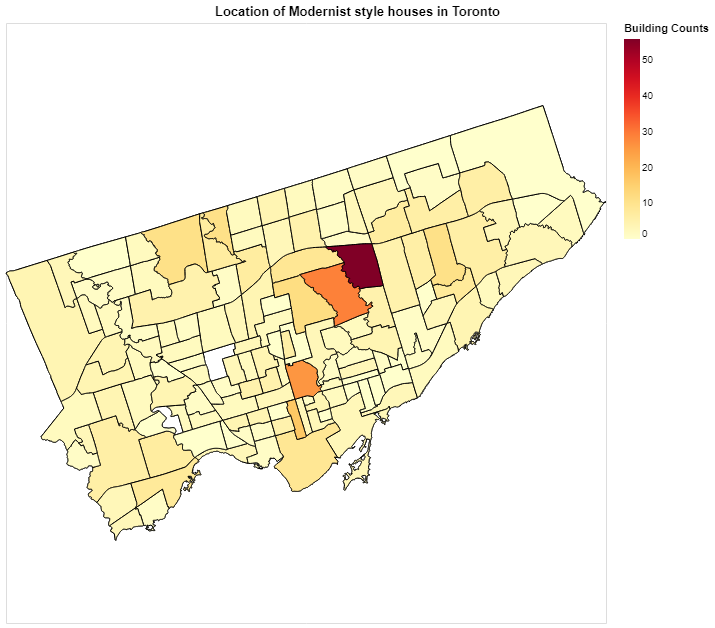

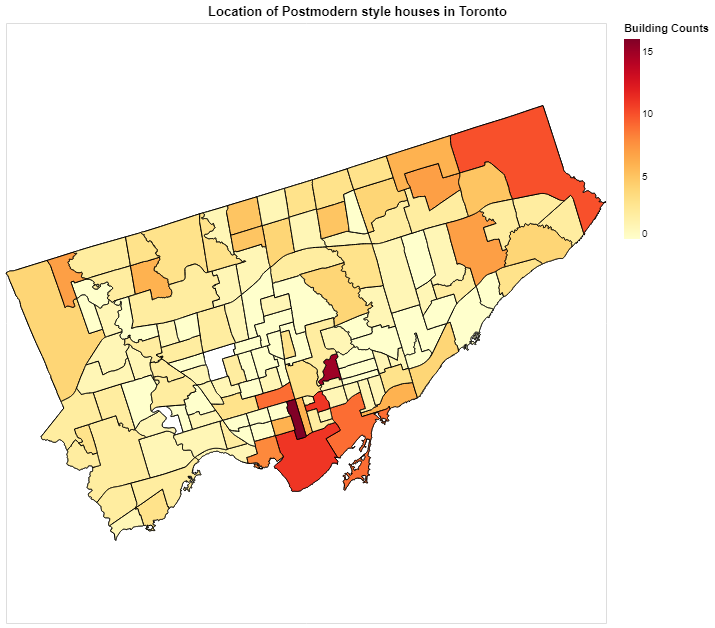

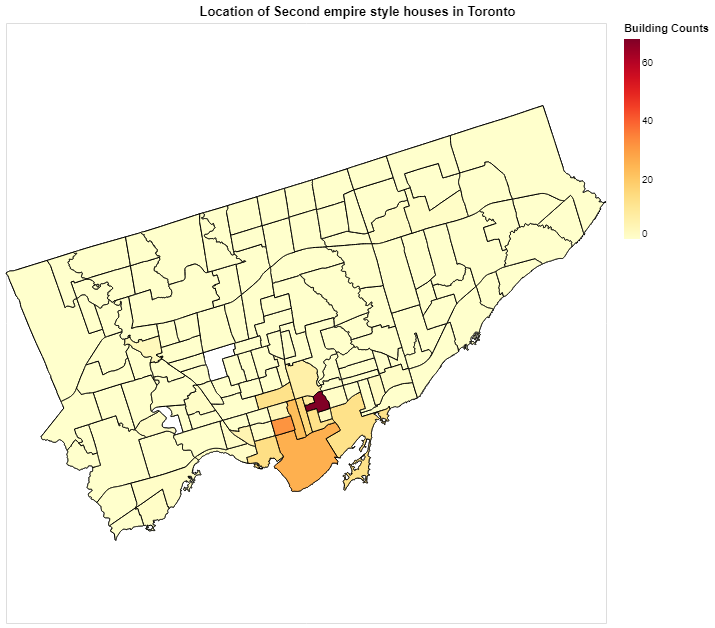

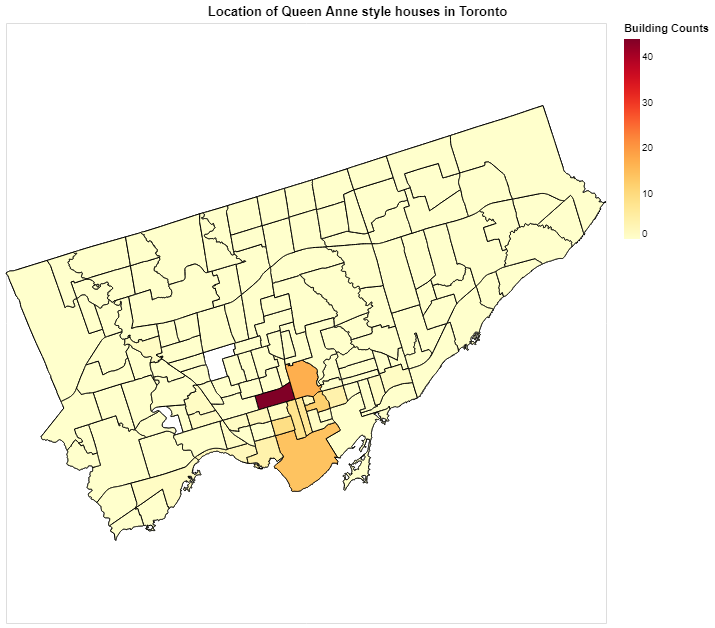

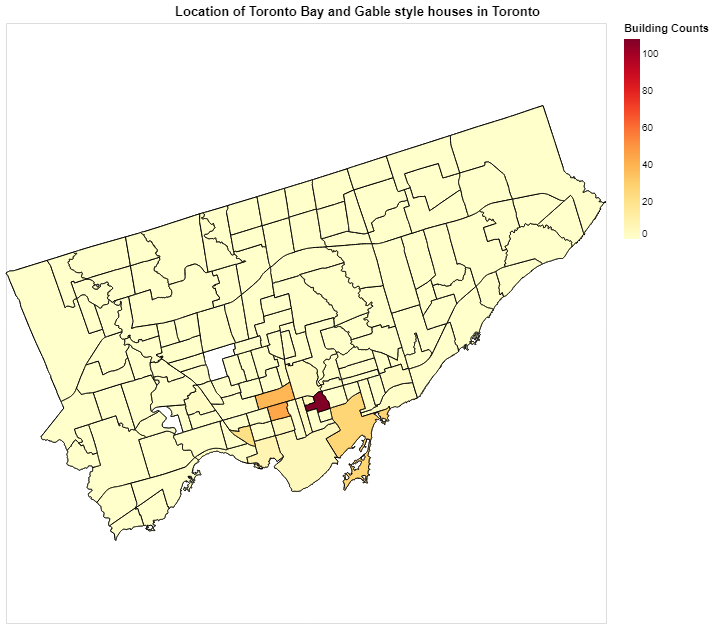

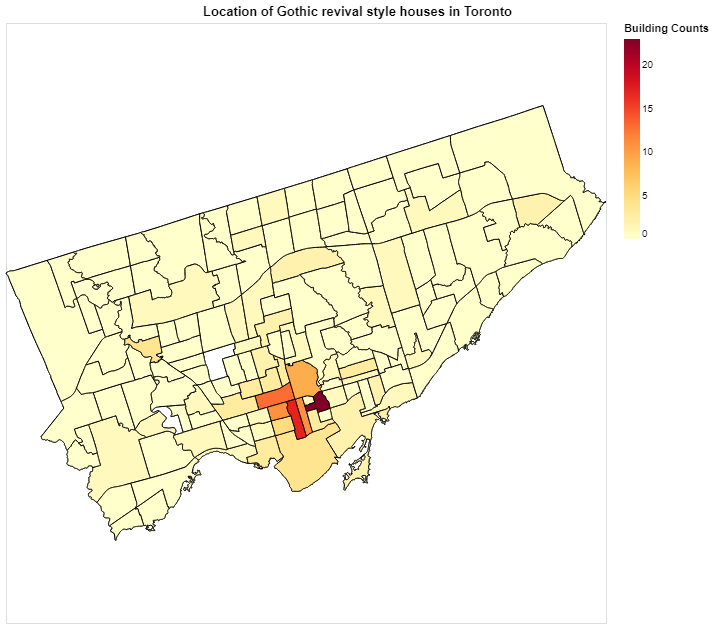

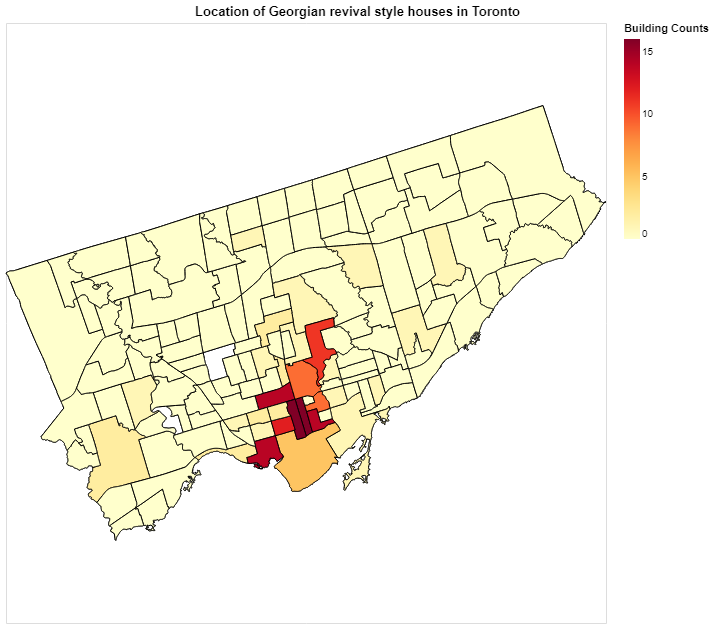

In [42]:
styles=['Modernist', 'Postmodern', 'Second empire', 'Queen Anne', 'Toronto Bay and Gable','Gothic revival','Georgian revival']
for astyle in styles:
    amap=plot_where_style_found(df,astyle)
    amap.display()